In [52]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from tqdm.notebook import tqdm

import plotly.express as px
import cv2
from sklearn import cluster
import seaborn as sns



import skimage
from skimage.feature import greycomatrix, greycoprops
from skimage.filters import sobel, sobel_h

# Load dataset into Memory

In [9]:
data = pd.read_csv('data/train.csv')
data.head()

,id,annotation,width,height,cell_type,plate_time,sample_date,sample_id,elapsed_timedelta
0,0030fd0e6378,118145 6 118849 7 119553 8 120257 8 120961 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
1,0030fd0e6378,189036 1 189739 3 190441 6 191144 7 191848 8 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
2,0030fd0e6378,173567 3 174270 5 174974 5 175678 6 176382 7 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
3,0030fd0e6378,196723 4 197427 6 198130 7 198834 8 199538 8 2...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
4,0030fd0e6378,167818 3 168522 5 169225 7 169928 8 170632 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00


In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73585 entries, 0 to 73584
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   id                 73585 non-null  object
 1   annotation         73585 non-null  object
 2   width              73585 non-null  int64 
 3   height             73585 non-null  int64 
 4   cell_type          73585 non-null  object
 5   plate_time         73585 non-null  object
 6   sample_date        73585 non-null  object
 7   sample_id          73585 non-null  object
 8   elapsed_timedelta  73585 non-null  object
dtypes: int64(2), object(7)
memory usage: 5.1+ MB


In [11]:
print(f"Training Dataset Shape: {data.shape}")

Training Dataset Shape: (73585, 9)


In [12]:
for col in data.columns:
    print(col + ":" + str(len(data[col].unique())))


id:606
annotation:73470
width:1
height:1
cell_type:3
plate_time:8
sample_date:18
sample_id:403
elapsed_timedelta:8


In [13]:
def getImagePaths(path):
    """
    Function to Combine Directory Path with individual Image Paths
    
    parameters: path(string) - Path of directory
    returns: image_names(string) - Full Image Path
    """
    image_names = []
    for dirname, _, filenames in os.walk(path):
        for filename in tqdm(filenames):
            fullpath = os.path.join(dirname, filename)
            image_names.append(fullpath)
    return image_names

In [14]:
train_images_path = getImagePaths('data/train')
test_images_path = getImagePaths('data/test')

  0%|          | 0/606 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

In [15]:
print(f"Number of train images: {len(train_images_path)}")
print(f"Number of test images:  {len(test_images_path)}")

Number of train images: 606
Number of test images:  3


# Plot Distributions

In [17]:
def plot_distribution(x):

    fig = px.histogram(
    data, 
    x = x,
    width = 800,
    height = 500,
    )
    
    fig.show()

In [18]:
plot_distribution('cell_type')

In [19]:
plot_distribution('plate_time')


In [20]:
plot_distribution('elapsed_timedelta')

# Image Examination

In [22]:


def display_multiple_img(images_paths, rows, cols):
    """
    Function to Display Images from Dataset.
    
    parameters: images_path(string) - Paths of Images to be displayed
                rows(int) - No. of Rows in Output
                cols(int) - No. of Columns in Output
    """
    figure, ax = plt.subplots(nrows=rows,ncols=cols,figsize=(16,8) )
    for ind,image_path in enumerate(images_paths):
        image=cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
        try:
            ax.ravel()[ind].imshow(image)
            ax.ravel()[ind].set_axis_off()
        except:
            continue;
    plt.tight_layout()
    plt.show()



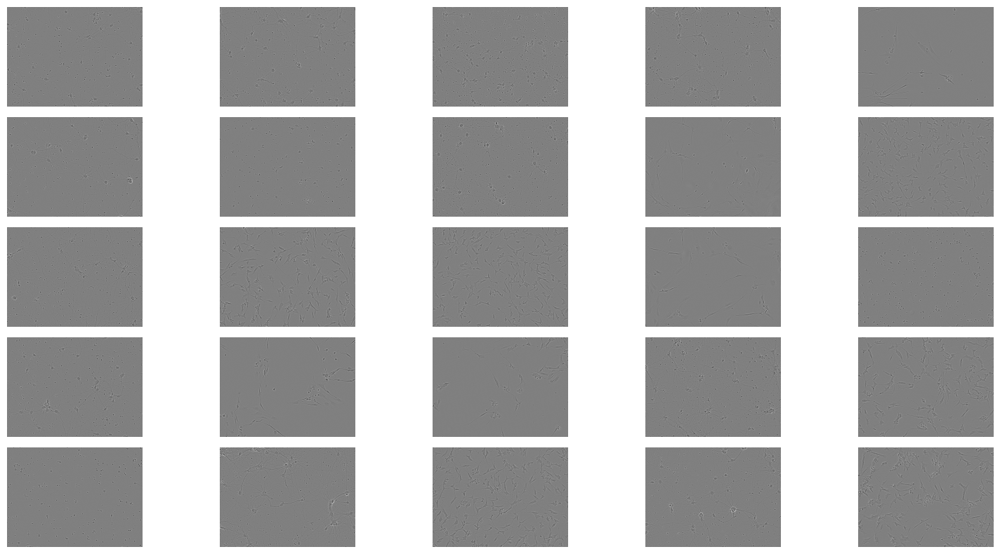

In [24]:
display_multiple_img(train_images_path[100:150], 5, 5)

# Mask Plots

In [25]:
def rle_decode(mask_rle, shape, color=1):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height, width, channels) of array to return 
    color: color for the mask
    Returns numpy array (mask)

    '''
    s = mask_rle.split()
    
    starts = list(map(lambda x: int(x) - 1, s[0::2]))
    lengths = list(map(int, s[1::2]))
    ends = [x + y for x, y in zip(starts, lengths)]
    
    img = np.zeros((shape[0] * shape[1], shape[2]), dtype=np.float32)
            
    for start, end in zip(starts, ends):
        img[start : end] = color
    
    return img.reshape(shape)

In [58]:
def build_masks(df_train, image_id, input_shape):
    height, width = input_shape
    labels = df_train[df_train["id"] == image_id]["annotation"].tolist()
    mask = np.zeros((height, width))
    for label in labels:
        mask += rle_decode(label, shape=(height, width))
    mask = mask.clip(0, 1)
    return mask

def plot_masks(image_id, colors=True):
    labels = data[data["id"] == image_id]["annotation"].tolist()
    cell_type = data[data["id"] == image_id]["cell_type"].tolist()
    cmap = {"shsy5y":(0,0,255),"astro":(0,255,0),"cort":(255,0,0)}

    if colors:
        mask = np.zeros((520, 704, 3))
        for label,cell_type in zip(labels,cell_type):
            c = cmap[cell_type]
            mask += rle_decode(label, shape=(520, 704, 3), color=c)
    else:
        mask = np.zeros((520, 704, 1))
        for label in labels:
            mask += rle_decode(label, shape=(520, 704, 1))
    mask = mask.clip(0, 1)
    image = cv2.imread(f"data/train/{image_id}.png")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(16, 32))
    plt.subplot(2, 1, 1)
    plt.imshow(image)
    plt.axis("off")
    plt.subplot(2, 1, 2)
    plt.imshow(image)
    plt.imshow(mask, alpha=0.5)
    plt.axis("off")

    plt.show()


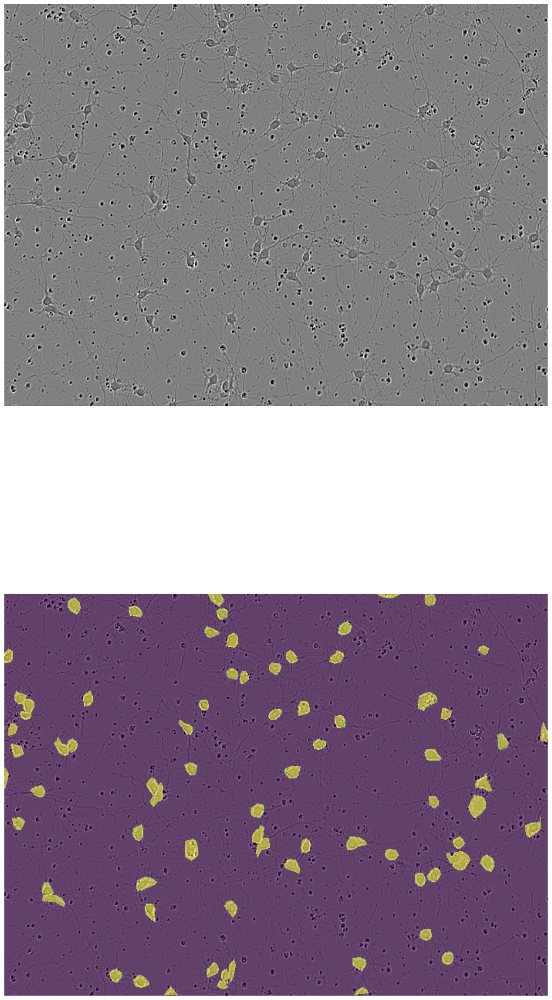

In [59]:
plot_masks("ffdb3cc02eef", colors=False)

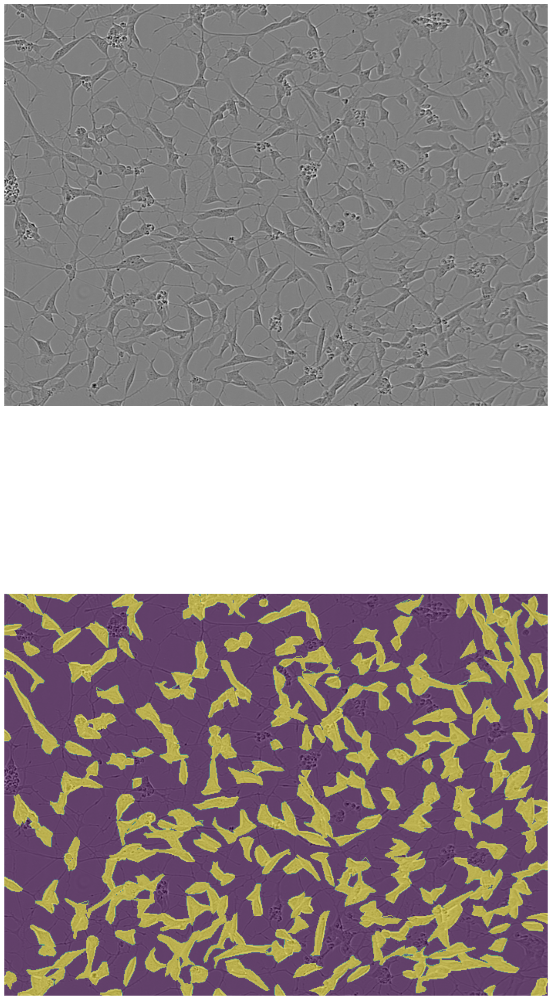

In [61]:
plot_masks("0030fd0e6378", colors=False)

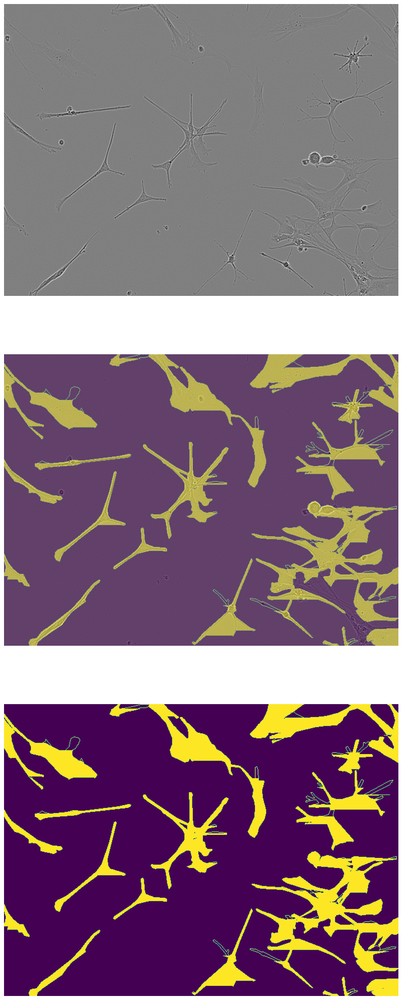

In [57]:
plot_masks('085eb8fec206', colors= False)

# Examine Mask Plots

In [31]:
def plot_masks_all(image_ids, colors=True):
    fig, ax = plt.subplots(len(image_ids),3,figsize=(16, 21))
    for idx,image_id in enumerate(image_ids):
        labels = data[data["id"] == image_id]["annotation"].tolist()
        cell_type = data[data["id"] == image_id]["cell_type"].tolist()
        cmap = {"shsy5y":(0,0,255),"astro":(0,255,0),"cort":(255,0,0)}

        if colors:
            mask = np.zeros((520, 704, 3))
            for label,cell_t in zip(labels,cell_type):
                c = cmap[cell_t]
                mask += rle_decode(label, shape=(520, 704, 3), color=c)
        else:
            mask = np.zeros((520, 704, 1))
            for label in labels:
                mask += rle_decode(label, shape=(520, 704, 1))
        mask = mask.clip(0, 1)

        image = cv2.imread(f"data/train/{image_id}.png")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        ax[idx,0].imshow(image)
        ax[idx,0].set_title(f"Image {image_id}: cell_type {cell_t} Original")
        plt.axis("off")
        
        ax[idx,1].imshow(image)
        ax[idx,1].imshow(mask, alpha=0.5)
        ax[idx,1].set_title(f"Image with mask")
        plt.axis("off")
        ax[idx,2].imshow(mask)
        ax[idx,2].set_title(f"Only Mask")
        plt.axis("off")
    plt.tight_layout()
    fig.suptitle("Annotations Colored by Cell_Type: {blue: shsy5y, green: astro, red: cort}",fontsize=16)
    plt.show()

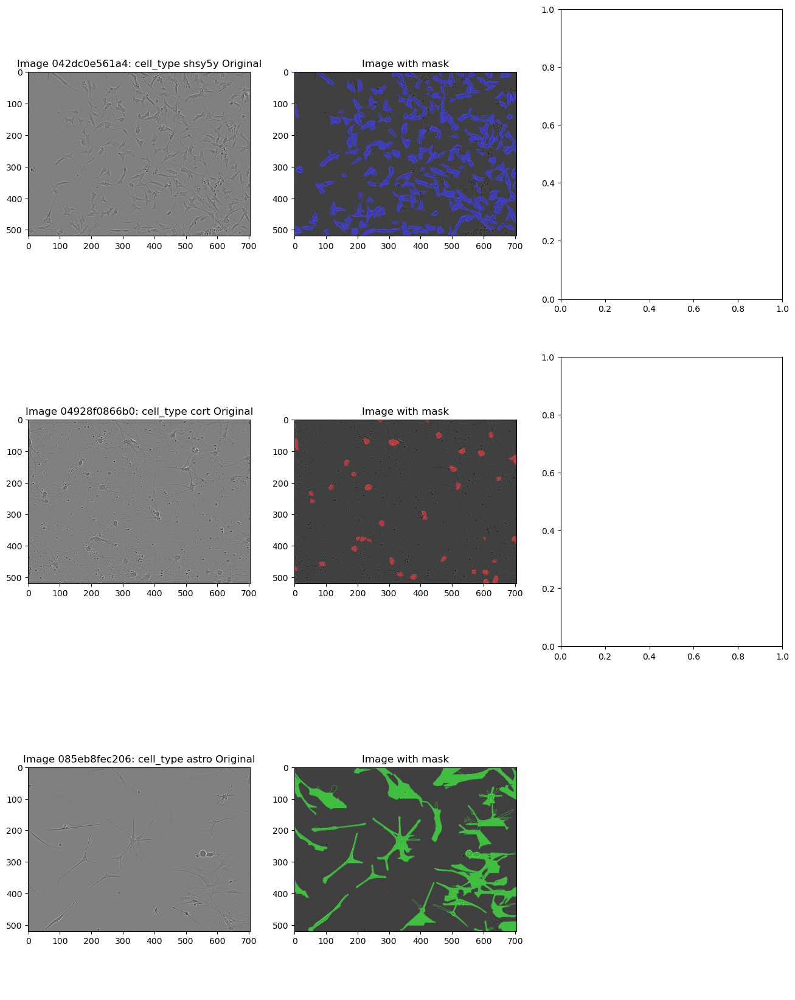

In [62]:
plot_masks_all(['042dc0e561a4', '04928f0866b0',  '085eb8fec206'])

# Basic Image Analysis

In [33]:
first = cv2.imread(train_images_path[0])
dims = np.shape(first)
print(dims)

(520, 704, 3)


In [34]:
np.min(first), np.max(first)

(1, 255)

In [35]:
pixel_matrix = np.reshape(first, (dims[0] * dims[1], dims[2]))
print(np.shape(pixel_matrix))

(366080, 3)


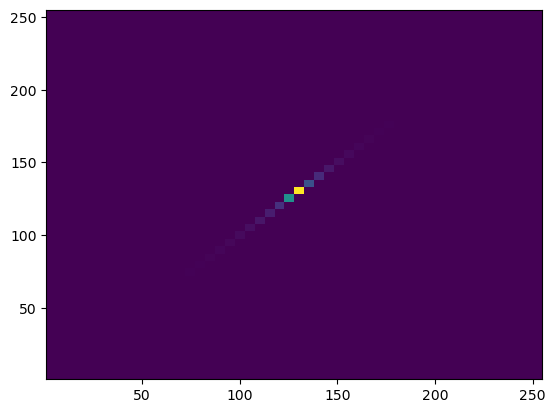

In [36]:
_ = plt.hist2d(pixel_matrix[:,1], pixel_matrix[:,2], bins=(50,50))

In [37]:
fifth = cv2.imread(train_images_path[4])
dims = np.shape(fifth)
pixel_matrix5 = np.reshape(fifth, (dims[0] * dims[1], dims[2]))

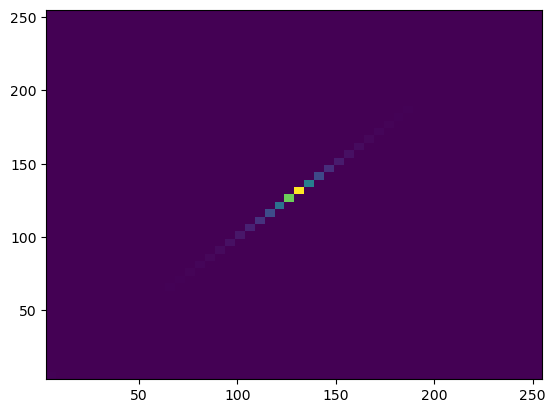

In [38]:
_ = plt.hist2d(pixel_matrix5[:,1], pixel_matrix5[:,2], bins=(50,50))

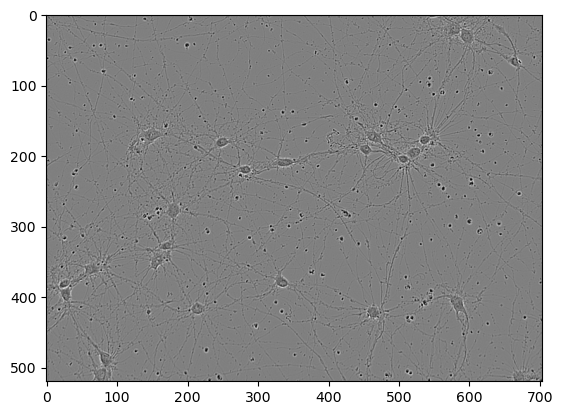

In [39]:
plt.imshow(first)

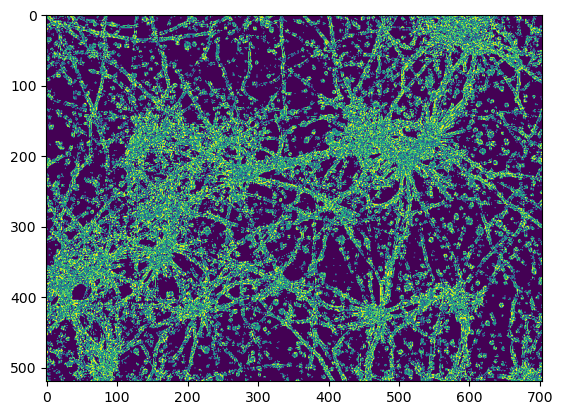

In [42]:
kmeans = cluster.KMeans(5)
clustered = kmeans.fit_predict(pixel_matrix)

dims = np.shape(first)
clustered_img = np.reshape(clustered, (dims[0], dims[1]))
plt.imshow(clustered_img)

In [43]:
ind0, ind1, ind2, ind3 = [np.where(clustered == x)[0] for x in [0, 1, 2, 3]]

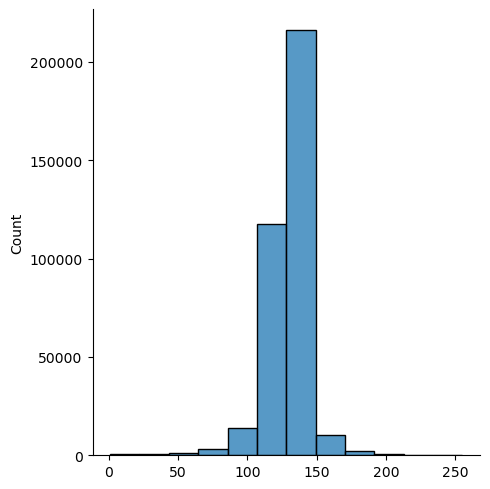

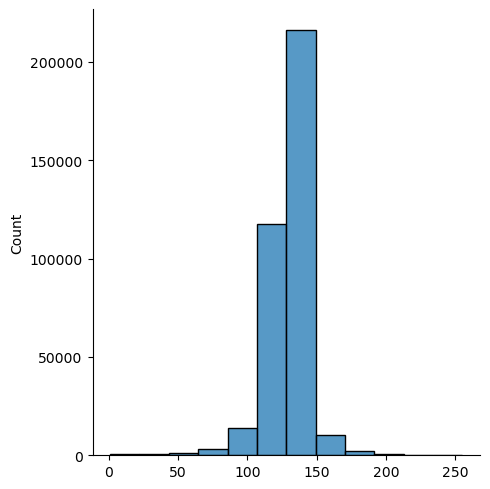

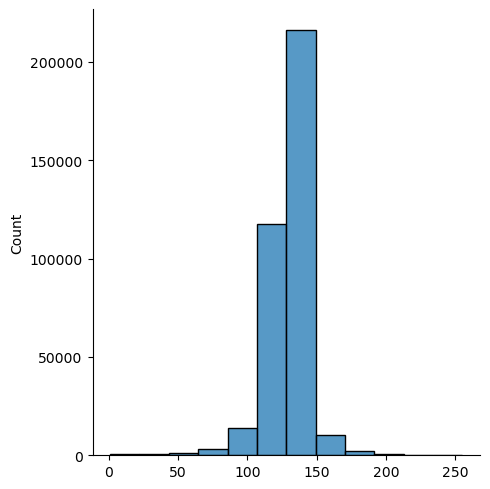

In [56]:
sns.displot(pixel_matrix[:,0], bins=12)
sns.displot(pixel_matrix[:,1], bins=12)
sns.displot(pixel_matrix[:,2], bins=12)

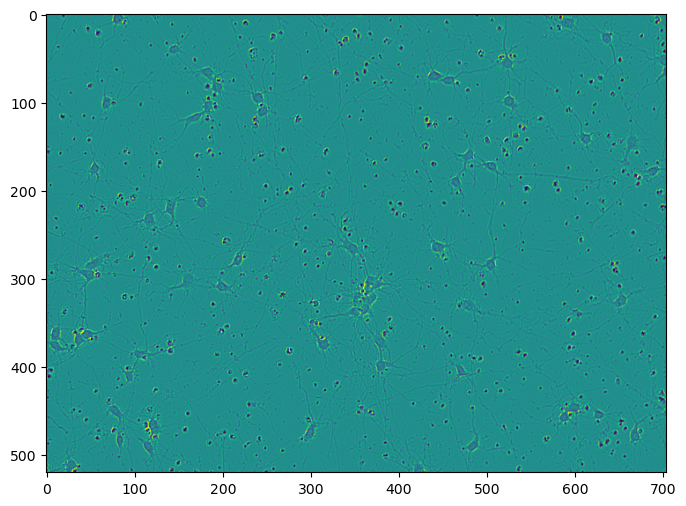

In [46]:
img79_1, img79_2, img79_3, img79_4, img79_5 = [plt.imread(train_images_path[n]) for n in range(78, 83)]


img_list = (img79_1, img79_2, img79_3, img79_4, img79_5)

plt.figure(figsize=(8,10))
plt.imshow(img_list[0])
plt.show()



# Rudimentary transforms, edge detection and texture

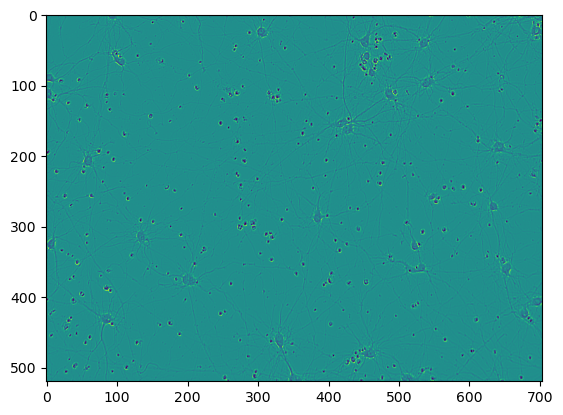

In [49]:
set144 = [plt.imread(train_images_path[n]) for n in (100, 200)]
plt.imshow(set144[0])

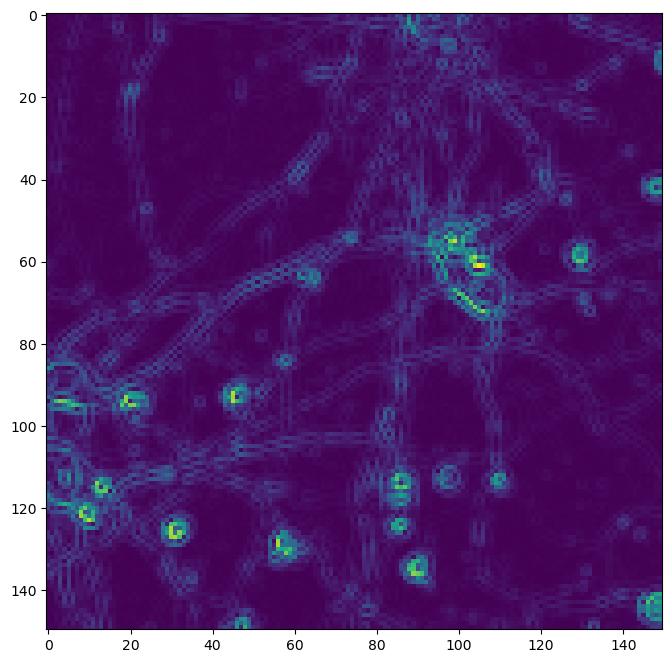

In [50]:
fig = plt.figure(figsize=(8, 8))
plt.imshow(sobel(set144[0][:150,:150]))

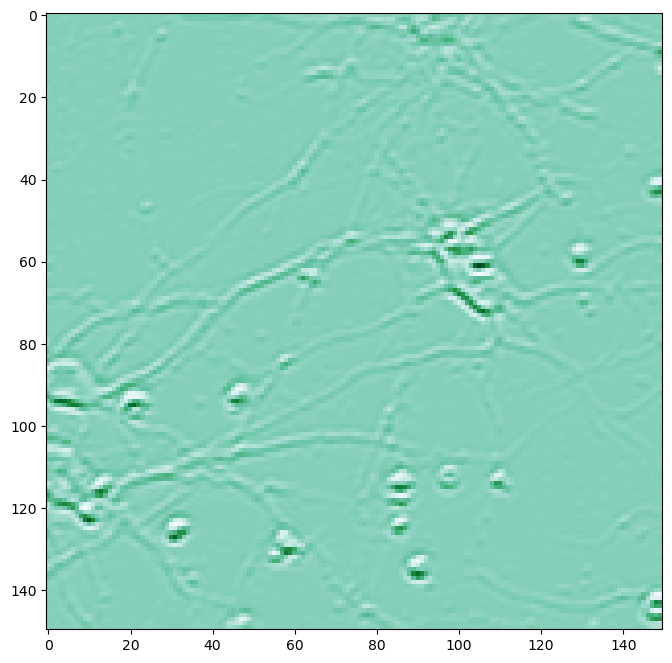

In [53]:
fig = plt.figure(figsize=(8, 8))
plt.imshow(sobel_h(set144[0][:150,:150]), cmap='BuGn')